### Импорт библиотек и загрузка датасетов

In [73]:
import json
from pathlib import Path
from typing import Dict
import numpy as np
from shapely import geometry


def iou_relative_quads(quad1, quad2):
    """
    Вычисляет Intersection over Union между двумя четырехугольниками.
    Четырехугольники должны быть представлены в относительном масштабе [0..1].
    В вычислении IoU учитывается только площадь в пределах значений [0..1].
    """
    quad1 = geometry.Polygon(quad1)
    quad2 = geometry.Polygon(quad2)

    # IoU вычисляется только в рамках кадра
    frame = geometry.Polygon([
        [0, 0],
        [0, 1],
        [1, 1],
        [1, 0]
    ])
    if not (quad1.is_valid and quad2.is_valid):
        return 0.0
    try:
        return (quad1 & quad2 & frame).area  / ((quad1 | quad2) & frame).area
    except Exception as exc:
        return 0.0

def dump_results_dict(unique_key2quad_dict: Dict, filename: Path):
    """
    Сохраняет значения словаря {"ключ": четырехугольник} в файл.
    """
    data = dict(
        (k, np.array(v).tolist())
        for (k, v) in unique_key2quad_dict.items()
    )
    with open(filename, 'w') as f:
        f.write(json.dumps(data))


def read_results_dict(filename: Path):
    """
    Читает значения словаря {"ключ": четырехугольник} из файла.
    """
    with open(filename, 'r') as f:
        return json.loads(f.read())


def measure_crop_accuracy(
    pred_filename: Path, gt_filename: Path,
    assert_same_keys:bool = False, iou_thr=0.95
    ):
    pred = read_results_dict(pred_filename)
    gt = read_results_dict(gt_filename)
    if assert_same_keys:
        assert set(pred.keys()) == set(gt.keys()), "Keys mismatch in gt/pred dicts"

    ious = []
    for key, gt_quad in gt.items():
        if key in pred:
            pred_quad = pred[key]
            ious.append(iou_relative_quads(gt_quad, pred_quad))
        else:
            ious.append(0)
    ious = np.array(ious)
    accuracy = (ious > iou_thr).astype(int).sum() / len(ious)
    return accuracy

def measure_crop_accuracy_with_info(
    pred_filename: Path, gt_filename: Path,
    assert_same_keys:bool = False, iou_thr=0.95
    ):
    pred = read_results_dict(pred_filename)
    gt = read_results_dict(gt_filename)
    low_iou_pics = {}
    if assert_same_keys:
        assert set(pred.keys()) == set(gt.keys()), "Keys mismatch in gt/pred dicts"

    ious = []
    for key, gt_quad in gt.items():
        if key in pred:
            pred_quad = pred[key]
            curr_iou = iou_relative_quads(gt_quad, pred_quad)
            if curr_iou < 0.95:
                low_iou_pics[key] = curr_iou
            ious.append(curr_iou)
        else:
            ious.append(0)
    ious = np.array(ious)
    accuracy = (ious > iou_thr).astype(int).sum() / len(ious)
    return accuracy, low_iou_pics


def _run_evaluation():
    base = Path(__file__).absolute().parent.parent
    gt_path = base / 'gt.json'
    pred_path = base / 'pred.json'
    score = measure_crop_accuracy(pred_path, gt_path)
    print("Accuracy[IoU>0.95] = {:1.4f}".format(score))

In [2]:
from dataclasses import dataclass
import json
from pathlib import Path
from typing import List
import warnings

import matplotlib.pyplot as plt
from matplotlib import patches
import numpy as np
from PIL import Image


@dataclass
class DataItem:
    """
    Изображение с разметкой-четырехугольником кропа.
    """
    gt_path: Path
    img_path: Path

    @property
    def unique_key(self):
        return "|".join(self.gt_path.parts[-4:])

    @property
    def image(self) -> Image:
        return Image.open(self.img_path)

    @property
    def gt_data(self)->dict:
        if hasattr(self, '_gt_data'):
            return self._gt_data

        try:
            with open(self.gt_path, 'r') as f:
                self._gt_data = json.loads(f.read())
        except UnicodeDecodeError as exc:
            # в оригинальных пакетах есть в шаблонах текст в не UTF-8 кодировках, например
            # китайский; этот текст не нужен для задания
            warnings.warn(f"Can't read {self.gt_path}, non unicode text", UnicodeWarning)
            self._gt_data = dict()
        return self._gt_data

    @property
    def quadrangle(self)->np.array:
        gt_data = self.gt_data
        if 'quad' in gt_data:
            quad = np.array(self.gt_data['quad']).astype(float)
            quad /= self.image_size[None]
            return quad
        return None

    @property
    def image_size(self):
        if not hasattr(self, '_image_size'):
            self._image_size = np.array(self.image.size).astype(float)
        return self._image_size

    def is_correct(self) -> bool:
        """
        Проверяет, существуют ли файлы изображения и разметки, и если да,
        то есть ли в файле разметки данные четырехугольника.
        Для разметки 'шаблона', т.е. идеально кропнутого изображения, лежащего в корне,
        этих дданных нет, потому что quad = [(0,0), (0,w), (h,w), (0,h)].
        """
        exists =  (self.gt_path.exists()) and (self.img_path.exists())
        return exists and ('quad' in self.gt_data)

    def show(self, quad01=None):
        """
        Отрисовывает четырехугольник кропа поверх изображения,
        либо quad01, либо quadrangle из разметки.
        quad01 должен быть в относительно масштабе (min ~ 0, max ~ 1).
        """
        fig, ax = plt.subplots()
        ax.imshow(np.array(self.image))
        if quad01 is None:
            quad01 = self.quadrangle
        quad = quad01 * self.image_size[None]
        p = patches.Polygon(quad, edgecolor = 'r', fill=False)
        ax.add_patch(p)

    def is_quad_inside(self) -> bool:
        """
        Находится ли четырехугольник разметки полностью внутри кадра.
        """
        assert self.is_correct(), "Incorrect item quad is undefined"
        return np.all(0 <= self.quadrangle) and np.all( self.quadrangle <= 1)

    def is_test_split(self) -> bool:
        """
        Принадлежит ли итем к test-разделу датасета.
        Правило разделения train/test следующее:
        - если итем принадлежит пакету с номером [44:50], то это test split
        - если итем в последовательности имеет номера [26:30], то это test split
        Таким образом, в тесте есть:
        ~ 7 * 300=2100 итемов, для которых не было примеров во время тренировки
        ~ 43 * (5/30) * 10=2150 итемов, чей которых были примеры во время тренировки
        Всего 4150 итемов.
        """
        assert self.is_correct(), "Incorrect item split is undefined"
        package_num = int(self.gt_path.parent.parent.parent.name.split('_')[0])
        sequence_num = int(self.gt_path.stem.split('_')[-1])

        if 25 < sequence_num <= 30:
            return True

        if 43 < package_num <= 50:
            return True
        return False

    def iou_with(self, pred_quad01: np.array) -> float:
        assert self.is_correct(), "Can't measure iou for incorrect item"
        return iou_relative_quads(self.quadrangle, pred_quad01)

    def __repr__(self):
        return f"DataItem<{self.gt_path}|{self.img_path}>"


class MidvPackage:
    """
    Один пакет данных MIDV-500.
    Контейнер для DataItem, лежащих в одном корневом
    """
    GT_SUBDIR = 'ground_truth'
    IMG_SUBDIR = 'images'

    @classmethod
    def read_midv500_dataset(cls, dataset_root:Path)->List['MidvPackage']:
        """Читает весь датасет MIDV-500 (список из пакетов 50)"""
        if not isinstance(dataset_root, Path):
            raise TypeError(f"Expected pathlib.Path type, got {type(dataset_root)}")
        package_paths = [p for p in dataset_root.glob("*") if p.is_dir()]
        return [cls(p) for p in package_paths]

    def __init__(self, root: Path):
        for subdir in (self.GT_SUBDIR, self.IMG_SUBDIR):
            assert (root / subdir).exists(), f"{self.root} does not contain '{subdir}'"

        self.root = root
        self.items = self.collect_items(root)
        self.template_item = self.collect_template(root)

    @classmethod
    def collect_items(cls, root_path: Path) -> List[DataItem]:
        """
        Собирает все DataItem в пакете, кроме шаблона.
        """
        items = []
        gt_root = root_path / cls.GT_SUBDIR
        img_root = root_path / cls.IMG_SUBDIR

        gt_paths = list(gt_root.rglob("*.json"))
        img_paths = [x for x in list(img_root.rglob("*")) if not x.is_dir() and not '.ipynb' in str(x)]

        key = lambda x: str(x.parent / x.stem)
        key_to_img, key_to_gt = dict(), dict()
        for p in gt_paths:
            key_to_gt[key(p.relative_to(gt_root))] = p
        for p in img_paths:
            key_to_img[key(p.relative_to(img_root))] = p

        simg = set(key_to_img.keys())
        sgt =  set(key_to_gt.keys())
        assert simg == sgt, f"{simg - sgt}, {sgt - simg}"
        for k, img_path in key_to_img.items():
            gt_path = key_to_gt[k]
            items.append(DataItem(gt_path=gt_path, img_path=img_path))
        return [it for it in items if it.is_correct()]

    @classmethod
    def collect_template(cls, root_path: Path) -> DataItem:
        """
        Возвращает DataItem-шаблон пакета. Не
        """
        gt_path = root_path / cls.GT_SUBDIR / (root_path.name + ".json")
        assert gt_path.exists(), f"Expected {gt_path} to be template gt, but it does not exist"

        img_path = None
        for ext in (".png", ".tif"):
            _img_path = root_path / cls.IMG_SUBDIR / (root_path.name + ext)
            if (_img_path.exists()):
                img_path = _img_path
        assert img_path is not None, "Expected to find template img, but it does not exist"
        return DataItem(gt_path=gt_path, img_path=img_path)

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        return self.items[idx]

    def __repr__(self):
        return f"DataPackage[{self.root}]({len(self)})"

In [3]:
!pip install torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html google-colab pyyaml==5.1

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 GB 770.3 kB/s eta 0:00:000:0100:02m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 46.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 10.6 MB/s eta 0:00:0000:0100:01m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.9/72.9 KB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 KB 28.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.2/64.2 KB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.5/104.5 KB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 758.9/758.9 KB 47.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 34.2 MB/s eta 0:00:0000:0100:01m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 31.1 MB/s eta 0:00:0000:01

In [4]:
import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

torch:  1.7 ; cuda:  cu110


In [5]:
!nvidia-smi
!nvcc --version

import torch
torch.__version__
import torchvision
torchvision.__version__

Sat May  7 17:38:20 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

'0.8.2+cu110'

In [6]:
import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu110/torch1.7/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

torch:  1.7 ; cuda:  cu110
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu110/torch1.7/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 5.2 MB/s eta 0:00:0000:0100:010m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.4/147.4 KB 714.0 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.7/74.7 KB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 KB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.6/106.6 KB 3.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.0/131.0 KB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.4/112.4 KB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.9/152.9 KB 5.3 MB/s eta 0:00:00

In [7]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
from google.colab.patches import cv2_imshow
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

/opt/conda/lib/python3.7/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [8]:
DATASET_PATH = Path('/kaggle/input/idcardsdataset')
assert DATASET_PATH.exists(), DATASET_PATH.absolute()

In [9]:
# Собираем список пакетов (MidvPackage) 
data_packs = MidvPackage.read_midv500_dataset(DATASET_PATH)
len(data_packs), type(data_packs[0])

(50, __main__.MidvPackage)

In [14]:
# В каждом пакете - 300 штук DataItem
dp = data_packs[10]
di = dp[110]
type(dp), len(dp), type(di)

(__main__.MidvPackage, 300, __main__.DataItem)

In [15]:
# DataItem содержит пути до файлов изображения и разметки
di.gt_path, di.img_path

(PosixPath('/kaggle/input/idcardsdataset/31_jpn_drvlic/ground_truth/TS/TS31_05.json'),
 PosixPath('/kaggle/input/idcardsdataset/31_jpn_drvlic/images/TS/TS31_05.png'))

In [16]:
# в gt_data (данные json) quad в абсолютных значениях (пиксели)
np.array(di.gt_data['quad'])

array([[ 78, 295],
       [399, 287],
       [432, 482],
       [ 77, 500]])

[[0.17333333 0.36875   ]
 [0.88666667 0.35875   ]
 [0.96       0.6025    ]
 [0.17111111 0.625     ]]


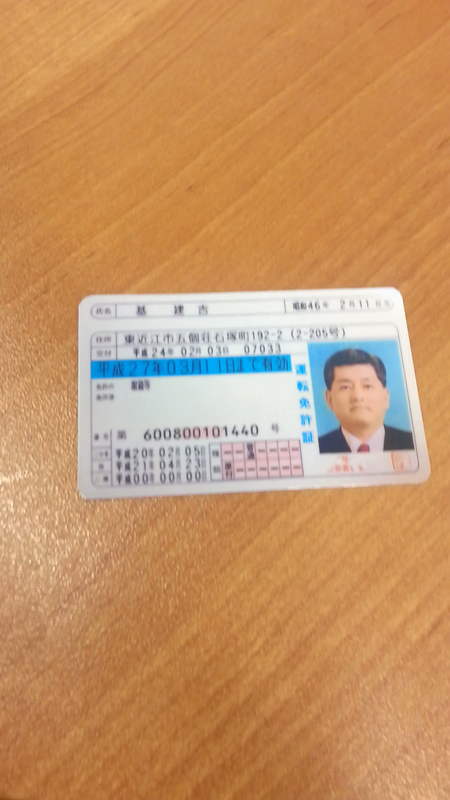

In [17]:
# Можно посмотреть изображения и разметку; в .quadrangle используются относительные единицы
print(di.quadrangle)
di.image

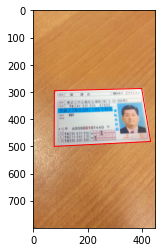

In [18]:
# Можно отрисовать разметку
# Не обязательно весь документ виден в кадре
di.show()

In [19]:
# DataItem содержит в себе информацию, относится ли он к test_split и целиком ли разметка внутри кадра
di.is_test_split(), di.is_quad_inside()

(False, True)

False


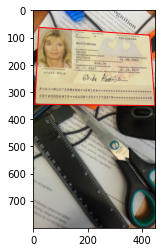

In [20]:
print(data_packs[38][238].is_test_split())
data_packs[38][238].show()

In [ ]:
from tqdm import tqdm

## Статистика, как часто разметка не целиком в кадре
is_quad_inside = []
for dp in tqdm(data_packs):
    for i in range(len(dp)):
        is_quad_inside.append(dp[i].is_quad_inside())
is_quad_inside = np.array(is_quad_inside).astype(int)
print(f"В {is_quad_inside.sum()} из {len(is_quad_inside)} случаев разметка кропа(т.е. документ) целиком в кадре")

In [ ]:
## Статистика test-split
is_test_split = []
for dp in tqdm(data_packs):
    for i in range(len(dp)):
        is_test_split.append(dp[i].is_test_split())
is_test_split = np.array(is_test_split).astype(int)
print(f"В {is_test_split.sum()} из {len(is_test_split)} случаев кадр принадлежит к test-split")

### Подготовка модели

In [10]:
MODEL = 'COCO-Keypoints/keypoint_rcnn_R_101_FPN_3x.yaml'

In [11]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file(MODEL))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(MODEL)
predictor = DefaultPredictor(cfg)

model_final_997cc7.pkl: 313MB [00:16, 18.7MB/s]                               


In [21]:
img = np.array(di.image)
preds = predictor(img)

/opt/conda/lib/python3.7/site-packages/detectron2/modeling/roi_heads/fast_rcnn.py:154: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  filter_inds = filter_mask.nonzero()


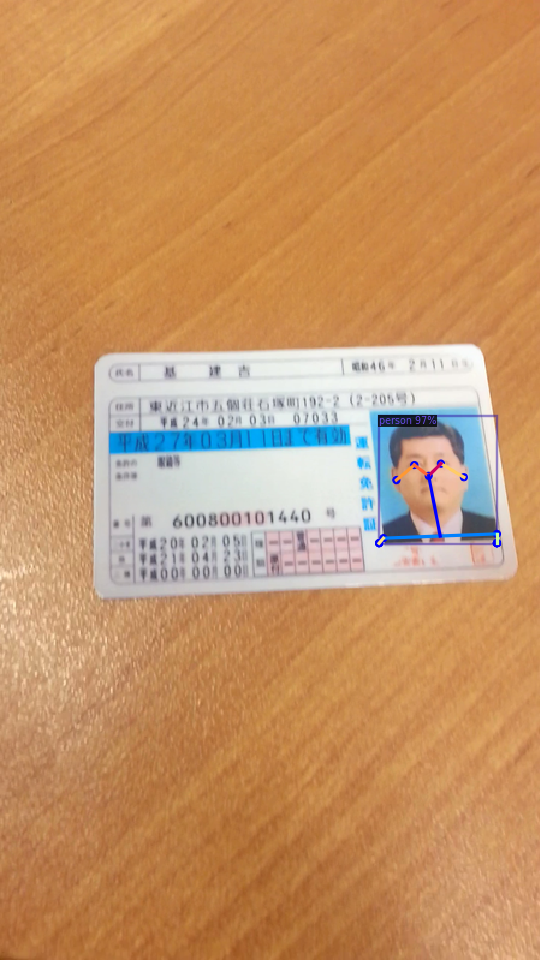

In [22]:
import cv2
import matplotlib.pyplot as plt

v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(preds["instances"][preds["instances"].scores >= 0.4].to("cpu"))
cv2_imshow(out.get_image())

In [23]:
di.gt_path, di.img_path

(PosixPath('/kaggle/input/idcardsdataset/31_jpn_drvlic/ground_truth/TS/TS31_05.json'),
 PosixPath('/kaggle/input/idcardsdataset/31_jpn_drvlic/images/TS/TS31_05.png'))

In [24]:
str(di.img_path).split('/')[-1][:-4]

'TS31_05'

In [25]:
print(di.image_size)

[450. 800.]


In [26]:
np.array(di.gt_data['quad'])

array([[ 78, 295],
       [399, 287],
       [432, 482],
       [ 77, 500]])

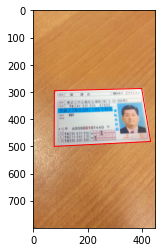

In [27]:
di.show()

### Подготовка датасета

In [28]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

from detectron2.structures import BoxMode

def get_dicts(dataset_packs, train_set=True):

    dataset_dicts = []
    for data_pack in dataset_packs:
        for data_item in data_pack:
            if (train_set and data_item.is_test_split()) or \
            (not train_set and not data_item.is_test_split()):
                continue

            record = {}
            img_path = str(data_item.img_path)
            height = int(data_item.image_size[1])
            width = int(data_item.image_size[0])
            record['file_name'] = img_path
            record['image_id'] = img_path.split('/')[-1][:-4]
            record['height'] = height
            record['width'] = width
          
            keypoints = []
            for x, y in np.array(data_item.gt_data['quad']):
                visible = 2 if 0 <= x <= width and 0 <= y <= height else 0
                if visible == 2:
                    keypoints.extend([x, y])
                else:
                    keypoints.extend([0, 0])
                keypoints.append(visible)

            quad = np.array(data_item.gt_data['quad'])
            p2 = max(quad[:, 0])
            p1 = min(quad[:, 0])
            q2 = max(quad[:, 1])
            q1 = min(quad[:, 1])

            w = p2 - p1
            h = q2 - q1

            cx = (p1 + p2) / 2
            cy = (q1 + q2) / 2

            box = [p1, q1, w, h]

            obj = {
                'bbox': box,
                'bbox_mode': BoxMode.XYWH_ABS,
                'keypoints': keypoints,
                'category_id': 0,
            }

            record['annotations'] = [obj]
            dataset_dicts.append(record)

    return dataset_dicts

for d in ['train', 'val']:
    DatasetCatalog.register('id_' + d, lambda d = d: 
              get_dicts(data_packs, train_set = d == 'train'))
    MetadataCatalog.get('id_' + d).set(thing_classes = ['id'], 
                                       keypoint_names = ['1', '2', '3', '4'],
                                       keypoint_flip_map = [('1', '2'), ('3', '4')])
    
text_metadata = MetadataCatalog.get('id_train')

In [29]:
dataset_dicts = get_dicts(data_packs, train_set=True)

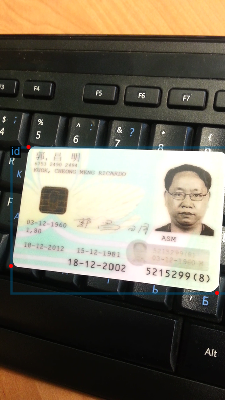

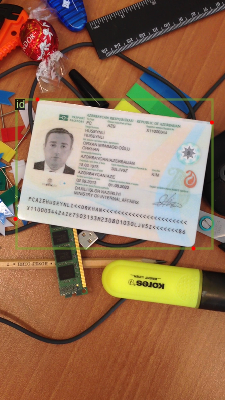

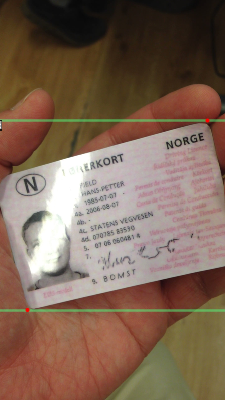

In [30]:
n = 0
while n < 3:
    pic = random.choice(dataset_dicts)
    if not pic['annotations']:
        continue
    img = cv2.imread(pic['file_name'])
    visualizer = Visualizer(img[:, :, ::-1], metadata=text_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(pic)
    cv2_imshow(out.get_image()[:, :, ::-1])
    n += 1

In [31]:
pic

{'file_name': '/kaggle/input/idcardsdataset/35_nor_drvlic/images/HA/HA35_14.png',
 'image_id': 'HA35_14',
 'height': 800,
 'width': 450,
 'annotations': [{'bbox': [-15, 241, 496, 379],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>,
   'keypoints': [0, 0, 0, 415, 241, 2, 0, 0, 0, 55, 620, 2],
   'category_id': 0}]}

### Запуск тренировки

In [32]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(MODEL))
cfg.DATASETS.TRAIN = ("id_train",)
cfg.DATASETS.TEST = ("id_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(MODEL)
cfg.SOLVER.IMS_PER_BATCH = 8
cfg.SOLVER.LR_POLICY = 'steps_with_decay'
cfg.SOLVER.BASE_LR = 0.01
cfg.SOLVER.MAX_ITER = 3000
cfg.SOLVER.STEPS = [1000, 2000]
cfg.SOLVER.GAMMA = 0.1
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS = 4
cfg.MODEL.ROI_KEYPOINT_HEAD.LOSS_WEIGHT = 1
cfg.INPUT.RANDOM_FLIP = "none"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [ ]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

In [120]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(MODEL))
cfg.DATASETS.TRAIN = ("id_train",)
cfg.DATASETS.TEST = ("id_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "/kaggle/input/idcardsmodel/model_final.pth"
cfg.SOLVER.IMS_PER_BATCH = 8
cfg.SOLVER.LR_POLICY = 'steps_with_decay'
cfg.SOLVER.BASE_LR = 0.0003
cfg.SOLVER.MAX_ITER = 1500
cfg.SOLVER.STEPS = [1000]
cfg.SOLVER.GAMMA = 0.5
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS = 4
cfg.MODEL.ROI_KEYPOINT_HEAD.LOSS_WEIGHT = 1
cfg.INPUT.RANDOM_FLIP = "none"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [121]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[05/07 19:48:37 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

### Оценка модели

In [ ]:
from IPython.display import FileLink
FileLink(r'./output/model_final.pth')

In [ ]:
os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

In [122]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
# cfg.MODEL.WEIGHTS = "/kaggle/input/idcardsmodel/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9
predictor = DefaultPredictor(cfg)

In [35]:
dataset_dicts = get_dicts(data_packs, train_set=False)

In [36]:
pic = random.choice(dataset_dicts)
im = cv2.imread(pic["file_name"])
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
outputs = outputs["instances"].to("cpu")

In [37]:
outputs

Instances(num_instances=1, image_height=800, image_width=450, fields=[pred_boxes: Boxes(tensor([[ 15.5583, 337.0320, 400.0768, 614.4886]])), scores: tensor([1.0000]), pred_classes: tensor([0]), pred_keypoints: tensor([[[ 16.4581, 351.7138,   9.2246],
         [384.7801, 337.9308,   2.3301],
         [399.1770, 590.2187,   3.8684],
         [ 16.4581, 613.5898,   0.8260]]]), pred_keypoint_heatmaps: tensor([[[[  5.5877,   1.8174,  -5.7232,  ...,   0.3155,  -6.0409,  -9.2192],
          [ 11.4172,   6.9239,  -2.0627,  ...,  -2.7665,  -7.9307, -10.5128],
          [ 23.0763,  17.1369,   5.2582,  ...,  -8.9306, -11.7103, -13.1002],
          ...,
          [  3.2938,   3.1464,   2.8516,  ..., -16.9129, -12.0547,  -9.6257],
          [ -2.7339,  -2.4292,  -1.8199,  ...,  -9.3888,  -7.3484,  -6.3282],
          [ -5.7478,  -5.2170,  -4.1556,  ...,  -5.6267,  -4.9952,  -4.6795]],

         [[ -0.9095,  -2.3711,  -5.2943,  ...,  17.0314,  16.4328,  16.1335],
          [ -1.2124,  -1.5180,  -2.1

In [38]:
outputs.pred_keypoints.size()

torch.Size([1, 4, 3])

In [39]:
outputs.pred_boxes

Boxes(tensor([[ 15.5583, 337.0320, 400.0768, 614.4886]]))

In [40]:
outputs.pred_keypoints

tensor([[[ 16.4581, 351.7138,   9.2246],
         [384.7801, 337.9308,   2.3301],
         [399.1770, 590.2187,   3.8684],
         [ 16.4581, 613.5898,   0.8260]]])

In [41]:
preds = np.array(predictor(im)['instances'].pred_keypoints.cpu())
preds = preds[0][:4, :2]
preds[:, 0] = preds[:, 0] / di.image_size[0]
preds[:, 1] = preds[:, 1] / di.image_size[1]
preds

array([[0.03657351, 0.43964222],
       [0.8550668 , 0.42241353],
       [0.8870599 , 0.73777336],
       [0.03657351, 0.7669872 ]], dtype=float32)

In [52]:
item = data_packs[0][50]
preds = np.array(predictor(np.array(item.image))['instances'].pred_keypoints.cpu())
preds = preds[0][:4, :2]
preds[:, 0] = preds[:, 0] / item.image_size[0]
preds[:, 1] = preds[:, 1] / item.image_size[1]
preds

array([[0.00322845, 0.38661236],
       [0.87871766, 0.409862  ],
       [0.87871766, 0.7001083 ],
       [0.00322845, 0.6851084 ]], dtype=float32)

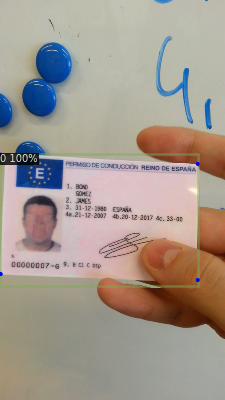

In [64]:
outputs = predictor(np.array(item.image))  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
outputs = outputs["instances"].to("cpu")
high_score_outputs = outputs[outputs.scores >= 0.35]
v = Visualizer(np.array(item.image)[:, :, ::-1], metadata=MetadataCatalog.get('id_valid'), scale=0.5)
out = v.draw_instance_predictions(high_score_outputs)
cv2_imshow(out.get_image())

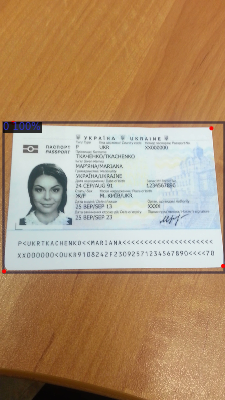

In [72]:
pic = random.choice(dataset_dicts)
im = cv2.imread(pic["file_name"])
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
outputs = outputs["instances"].to("cpu")
high_score_outputs = outputs[outputs.scores >= 0.35]
v = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get('id_valid'), scale=0.5)
out = v.draw_instance_predictions(high_score_outputs)
cv2_imshow(out.get_image()[:, :, ::-1])

In [123]:
from tqdm import tqdm

results_dict = dict()

for dp in tqdm(data_packs):
    for i in range(len(dp)):
        if dp[i].is_test_split():
            try:
                pic = dp[i].unique_key
                pic = pic.replace("ground_truth", "images")
                pic = pic.replace("json", "png")
                pic = pic.replace("|", "/")
                img = cv2.imread("/kaggle/input/idcardsdataset/" + pic)
                preds = np.array(predictor(img)['instances'].pred_keypoints.cpu())
                preds = preds[0][:4, :2]
                preds[:, 0] = preds[:, 0] / dp[i].image_size[0]
                preds[:, 1] = preds[:, 1] / dp[i].image_size[1]
                results_dict[dp[i].unique_key] = preds
            except Exception as exc:
                print(exc)

 48%|████▊     | 24/50 [03:26<03:07,  7.22s/it]

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


 52%|█████▏    | 26/50 [04:15<05:46, 14.45s/it]

index 0 is out of bounds for axis 0 with size 0


 60%|██████    | 30/50 [05:18<04:09, 12.46s/it]

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


 68%|██████▊   | 34/50 [06:22<03:11, 11.98s/it]

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


 80%|████████  | 40/50 [07:39<01:34,  9.47s/it]

index 0 is out of bounds for axis 0 with size 0


 82%|████████▏ | 41/50 [07:47<01:19,  8.83s/it]

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

 98%|█████████▊| 49/50 [09:18<00:08,  8.08s/it]

index 0 is out of bounds for axis 0 with size 0


100%|██████████| 50/50 [10:00<00:00, 12.02s/it]


In [124]:
dump_results_dict(results_dict, "./pred.json")

In [ ]:
FileLink(r'./pred.json')

In [125]:
acc = measure_crop_accuracy(
    "./pred.json",
    "/kaggle/input/idcardsgt/gt.json"
)
print("Точность кропа: {:1.4f}".format(acc))

Точность кропа: 0.7967


In [126]:
acc, low_iou_pics = measure_crop_accuracy_with_info(
    "./pred.json",
    "/kaggle/input/idcardsgt/gt.json"
)
print("Точность кропа: {:1.4f}".format(acc))

Точность кропа: 0.7967


In [77]:
for k, v in low_iou_pics.items():
    print(k, v)

01_alb_id|ground_truth|HA|HA01_26.json 0.5270365704210493
01_alb_id|ground_truth|HA|HA01_27.json 0.5287320718404378
01_alb_id|ground_truth|HA|HA01_28.json 0.5146170707416327
01_alb_id|ground_truth|HA|HA01_29.json 0.9448111622273686
01_alb_id|ground_truth|HA|HA01_30.json 0.9355302344439534
01_alb_id|ground_truth|HS|HS01_27.json 0.9447253285337336
01_alb_id|ground_truth|PA|PA01_27.json 0.4916753737436716
01_alb_id|ground_truth|PA|PA01_28.json 0.4866734941294839
02_aut_drvlic_new|ground_truth|CS|CS02_30.json 0.4986106724552449
02_aut_drvlic_new|ground_truth|HA|HA02_29.json 0.945808021110659
02_aut_drvlic_new|ground_truth|HA|HA02_30.json 0.9288436625800512
02_aut_drvlic_new|ground_truth|HS|HS02_26.json 0.9190144169342374
02_aut_drvlic_new|ground_truth|HS|HS02_27.json 0.46846328500042145
02_aut_drvlic_new|ground_truth|HS|HS02_28.json 0.5501921410621365
02_aut_drvlic_new|ground_truth|PA|PA02_28.json 0.9156658136599527
02_aut_drvlic_new|ground_truth|PA|PA02_29.json 0.8854497145389597
02_aut_d

03_aut_id_old/images/PA/PA03_27.png 0.5263270141112225


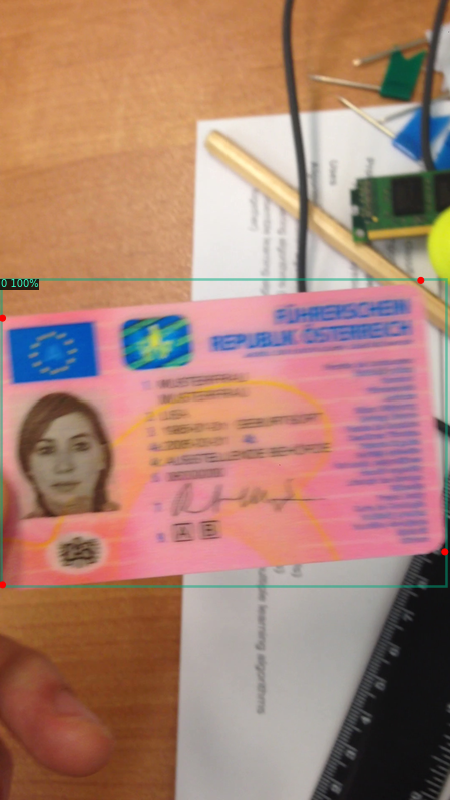

tensor([[0.0057, 0.3977],
        [0.9351, 0.3505],
        [0.9884, 0.6899],
        [0.0057, 0.7311]])


In [98]:
for i, (pic, val) in enumerate(low_iou_pics.items()):
    if i == 20:
        pic = pic.replace("ground_truth", "images")
        pic = pic.replace("json", "png")
        pic = pic.replace("|", "/")
        print(pic, val)
        im = cv2.imread("/kaggle/input/idcardsdataset/" + pic)
        outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
        outputs = outputs["instances"].to("cpu")
        high_score_outputs = outputs[outputs.scores >= 0.35]
        v = Visualizer(im[:, :, ::-1])
        out = v.draw_instance_predictions(high_score_outputs)
        cv2_imshow(out.get_image()[:, :, ::-1])
        
        preds = outputs.pred_keypoints.cpu()
        preds = preds[0][:4, :2]
        preds[:, 0] = preds[:, 0] / dp[i].image_size[0]
        preds[:, 1] = preds[:, 1] / dp[i].image_size[1]
        print(preds)
        
    if i == 20:
        break

In [105]:
for dp in tqdm(data_packs):
    for i in range(len(dp)):
        if dp[i].unique_key == "03_aut_id_old|ground_truth|PA|PA03_27.json":
            try:
                pic = dp[i].unique_key
                pic = pic.replace("ground_truth", "images")
                pic = pic.replace("json", "png")
                pic = pic.replace("|", "/")
                print(pic, val)
                img = cv2.imread("/kaggle/input/idcardsdataset/" + pic)
                preds = np.array(predictor(img)['instances'].pred_keypoints.cpu())
                preds = preds[0][:4, :2]
                preds[:, 0] = preds[:, 0] / dp[i].image_size[0]
                preds[:, 1] = preds[:, 1] / dp[i].image_size[1]
                print(preds)
            except Exception as exc:
                print(exc)

100%|██████████| 50/50 [00:00<00:00, 285.85it/s]

03_aut_id_old/images/PA/PA03_27.png 0.5263270141112225
[[0.00567482 0.39768627]
 [0.93511915 0.3504847 ]
 [0.9883825  0.6898864 ]
 [0.00567482 0.73109406]]


In [112]:
results_dict = dict()

for dp in tqdm(data_packs):
    for i in range(len(dp)):
        if dp[i].is_test_split():
            try:
                pic = dp[i].unique_key
                pic = pic.replace("ground_truth", "images")
                pic = pic.replace("json", "png")
                pic = pic.replace("|", "/")
                img = cv2.imread("/kaggle/input/idcardsdataset/" + pic)
                preds = np.array(predictor(img)['instances'].pred_keypoints.cpu())
                preds = preds[0][:4, :2]
                preds[:, 0] = preds[:, 0] / dp[i].image_size[0]
                preds[:, 1] = preds[:, 1] / dp[i].image_size[1]
                results_dict[dp[i].unique_key] = preds
            except Exception as exc:
                print(exc)

 48%|████▊     | 24/50 [03:26<03:06,  7.17s/it]

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


 60%|██████    | 30/50 [05:19<04:10, 12.51s/it]

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


 68%|██████▊   | 34/50 [06:22<03:12, 12.01s/it]

index 0 is out of bounds for axis 0 with size 0


 80%|████████  | 40/50 [07:40<01:35,  9.53s/it]

index 0 is out of bounds for axis 0 with size 0


 82%|████████▏ | 41/50 [07:47<01:19,  8.80s/it]

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


100%|██████████| 50/50 [10:02<00:00, 12.05s/it]


In [113]:
dump_results_dict(results_dict, "./pred.json")

In [114]:
acc = measure_crop_accuracy(
    "./pred.json",
    "/kaggle/input/idcardsgt/gt.json"
)
print("Точность кропа: {:1.4f}".format(acc))

Точность кропа: 0.8021


In [115]:
acc, low_iou_pics = measure_crop_accuracy_with_info(
    "/kaggle/working/pred.json",
    "/kaggle/input/idcardsgt/gt.json"
)
print("Точность кропа: {:1.4f}".format(acc))

Точность кропа: 0.8021


In [119]:
for k, v in low_iou_pics.items():
    print(k, v)

01_alb_id|ground_truth|HA|HA01_26.json 0.50761454801918
01_alb_id|ground_truth|HA|HA01_27.json 0.5287925498954452
01_alb_id|ground_truth|HA|HA01_28.json 0.5289450299969423
01_alb_id|ground_truth|HA|HA01_29.json 0.5085930785228961
01_alb_id|ground_truth|HA|HA01_30.json 0.9312025616695456
01_alb_id|ground_truth|PA|PA01_27.json 0.49479052916424443
01_alb_id|ground_truth|PA|PA01_28.json 0.49583045564939016
01_alb_id|ground_truth|PA|PA01_29.json 0.48104840363740575
02_aut_drvlic_new|ground_truth|HA|HA02_26.json 0.9375167777159797
02_aut_drvlic_new|ground_truth|HA|HA02_30.json 0.9475032631537038
02_aut_drvlic_new|ground_truth|HS|HS02_26.json 0.9216359432495645
02_aut_drvlic_new|ground_truth|HS|HS02_27.json 0.4659721447074975
02_aut_drvlic_new|ground_truth|HS|HS02_28.json 0.9355559224358356
02_aut_drvlic_new|ground_truth|KA|KA02_28.json 0.519404450364343
02_aut_drvlic_new|ground_truth|PA|PA02_28.json 0.5267102813547422
02_aut_drvlic_new|ground_truth|PA|PA02_29.json 0.8865793298723138
02_aut_d

01_alb_id/images/HA/HA01_26.png 0.50761454801918


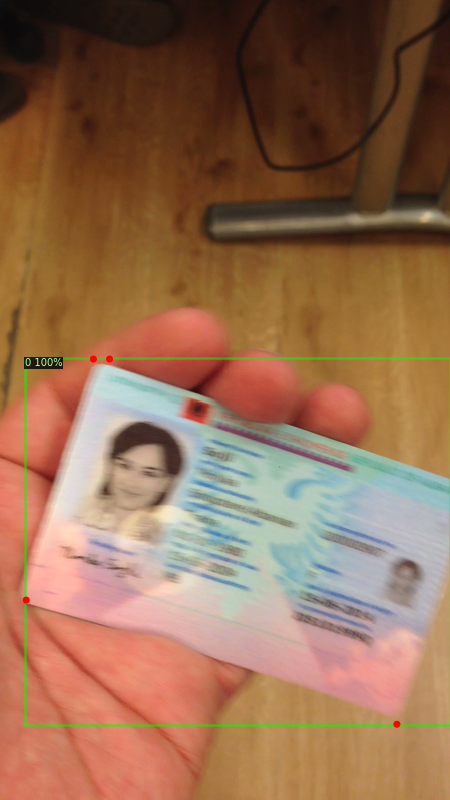

tensor([[0.2075, 0.4488],
        [0.2435, 0.4488],
        [0.8820, 0.9053],
        [0.0581, 0.7501]])
01_alb_id/images/HA/HA01_27.png 0.5287925498954452


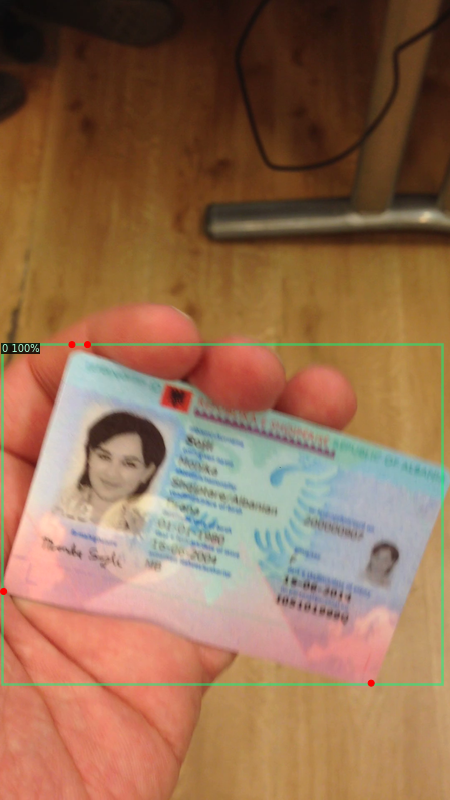

tensor([[0.1599, 0.4308],
        [0.1945, 0.4308],
        [0.8248, 0.8539],
        [0.0080, 0.7394]])
01_alb_id/images/HA/HA01_28.png 0.5289450299969423


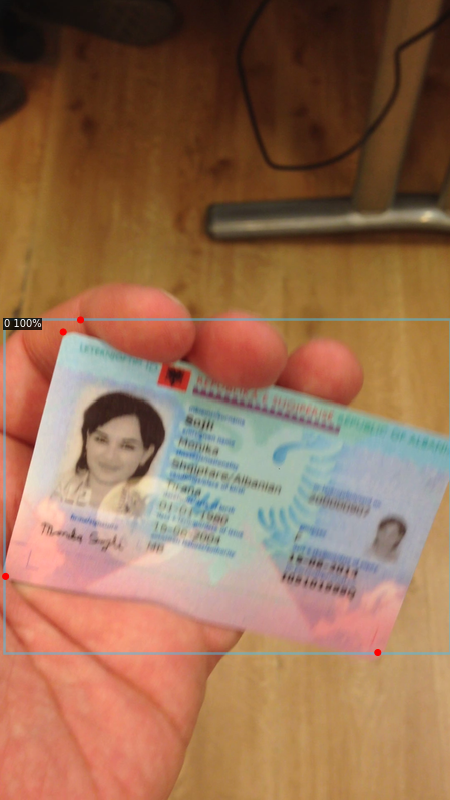

tensor([[0.1404, 0.4149],
        [0.1790, 0.3999],
        [0.8395, 0.8156],
        [0.0125, 0.7205]])
01_alb_id/images/HA/HA01_29.png 0.5085930785228961


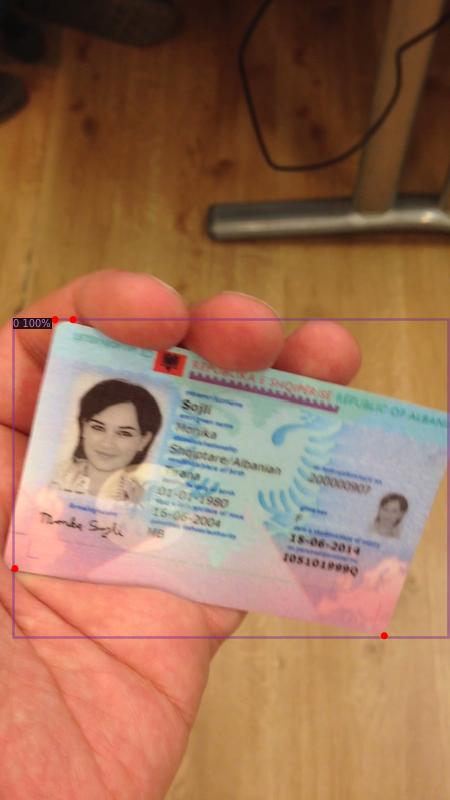

tensor([[0.1225, 0.3996],
        [0.1625, 0.3996],
        [0.8539, 0.7948],
        [0.0333, 0.7108]])
01_alb_id/images/HA/HA01_30.png 0.9312025616695456


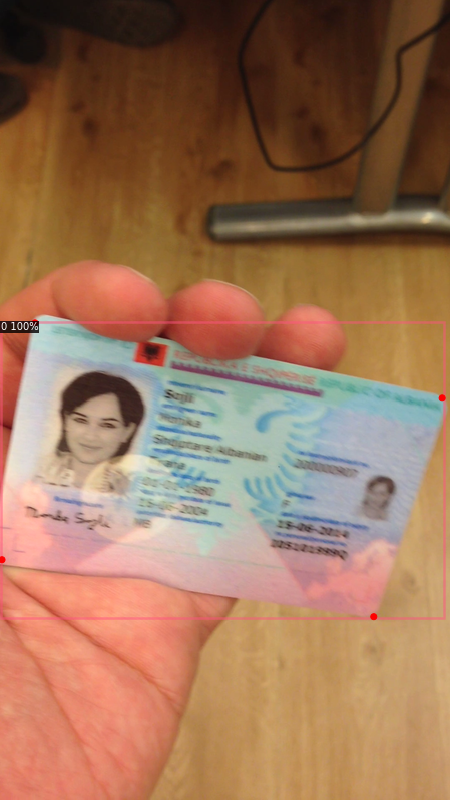

tensor([[0.0777, 0.4036],
        [0.9825, 0.4973],
        [0.8306, 0.7709],
        [0.0044, 0.6997]])
01_alb_id/images/PA/PA01_27.png 0.49479052916424443


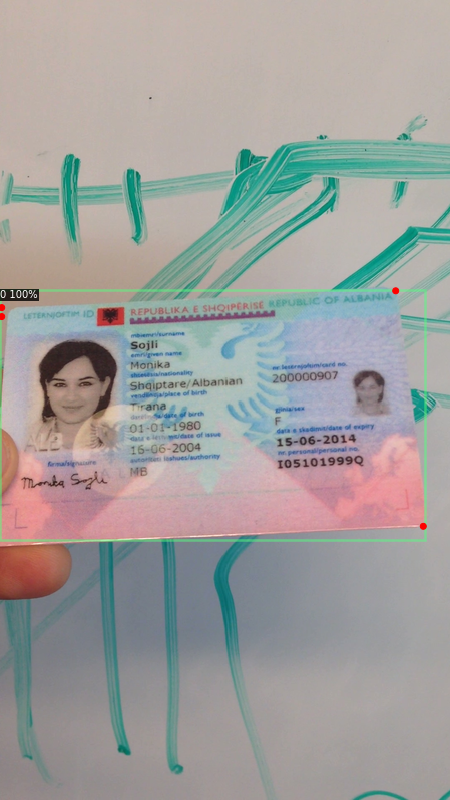

tensor([[0.0038, 0.3845],
        [0.8793, 0.3635],
        [0.9406, 0.6579],
        [0.0038, 0.3957]])
01_alb_id/images/PA/PA01_28.png 0.49583045564939016


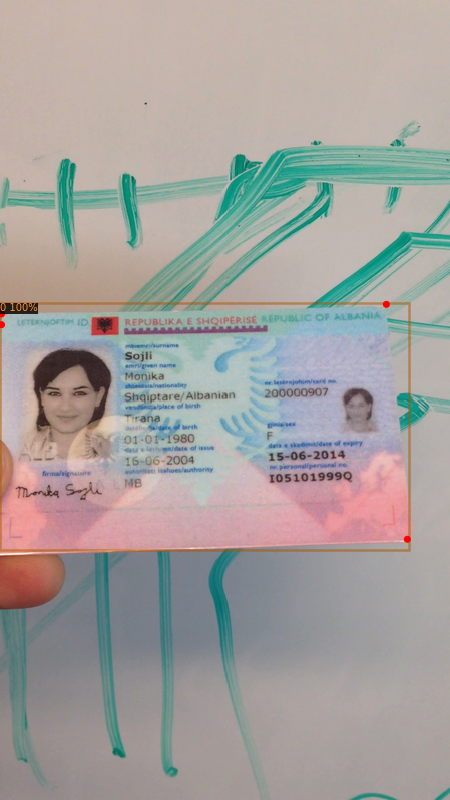

tensor([[0.0033, 0.3924],
        [0.8586, 0.3804],
        [0.9052, 0.6741],
        [0.0033, 0.4059]])
01_alb_id/images/PA/PA01_29.png 0.48104840363740575


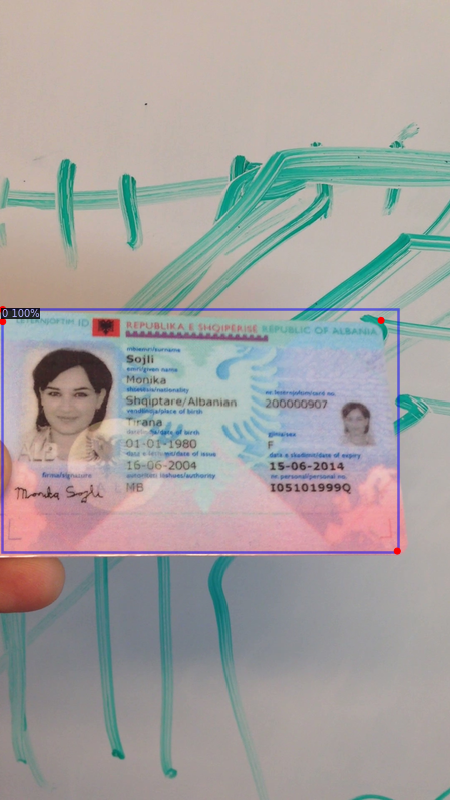

tensor([[0.0060, 0.3870],
        [0.8468, 0.4005],
        [0.8828, 0.6888],
        [0.0060, 0.4020]])
02_aut_drvlic_new/images/HA/HA02_26.png 0.9375167777159797


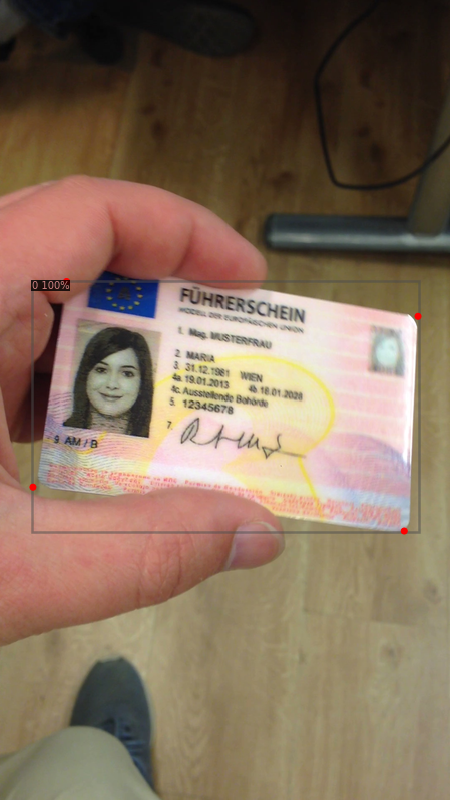

tensor([[0.1478, 0.3519],
        [0.9290, 0.3953],
        [0.8983, 0.6638],
        [0.0732, 0.6090]])
02_aut_drvlic_new/images/HA/HA02_30.png 0.9475032631537038


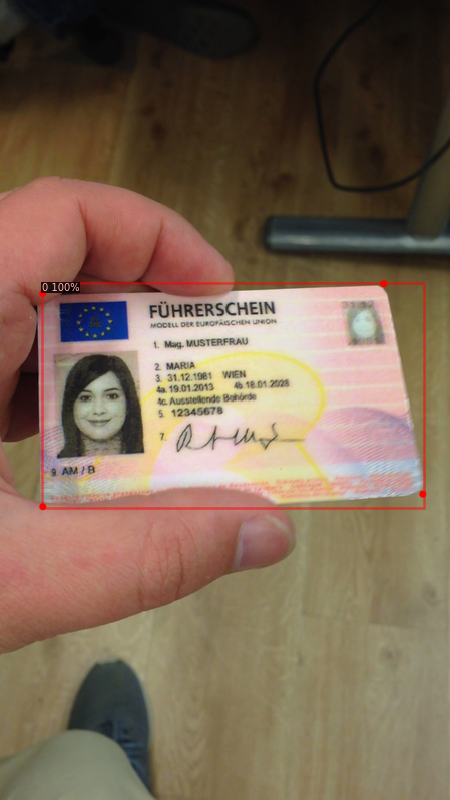

tensor([[0.0952, 0.3666],
        [0.8530, 0.3546],
        [0.9396, 0.6177],
        [0.0952, 0.6334]])
02_aut_drvlic_new/images/HS/HS02_26.png 0.9216359432495645


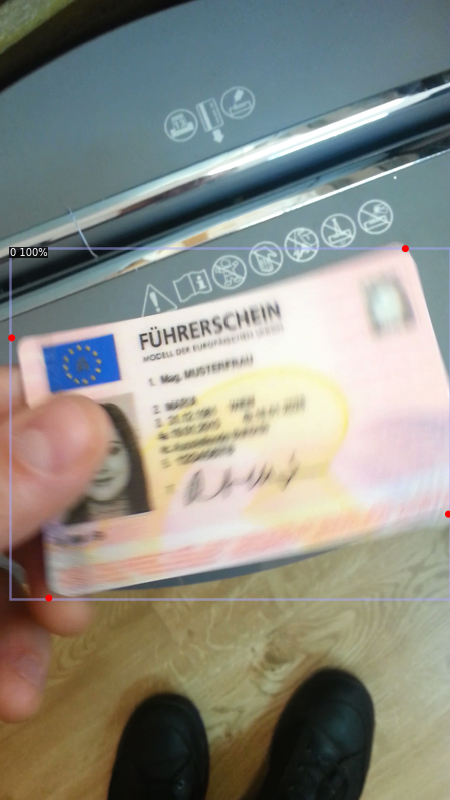

tensor([[0.0259, 0.4224],
        [0.9008, 0.3108],
        [0.9967, 0.6427],
        [0.1085, 0.7475]])
02_aut_drvlic_new/images/HS/HS02_27.png 0.4659721447074975


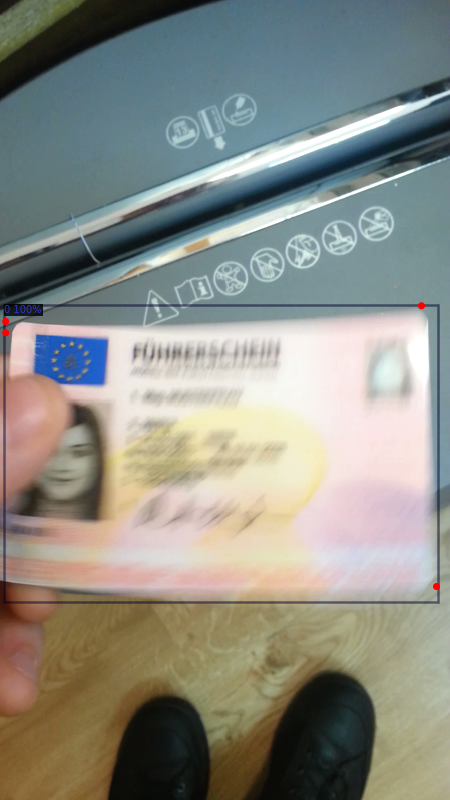

tensor([[0.0127, 0.4017],
        [0.9366, 0.3823],
        [0.9700, 0.7332],
        [0.0127, 0.4160]])
02_aut_drvlic_new/images/HS/HS02_28.png 0.9355559224358356


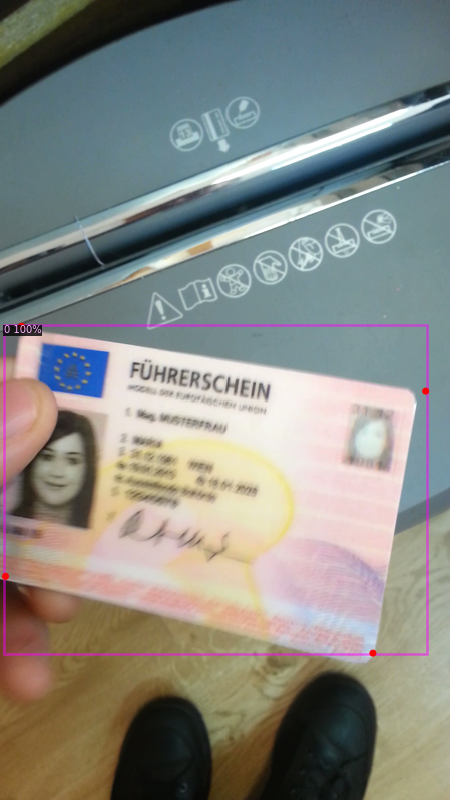

tensor([[0.0480, 0.4079],
        [0.9459, 0.4889],
        [0.8287, 0.8164],
        [0.0120, 0.7205]])
02_aut_drvlic_new/images/KA/KA02_28.png 0.519404450364343


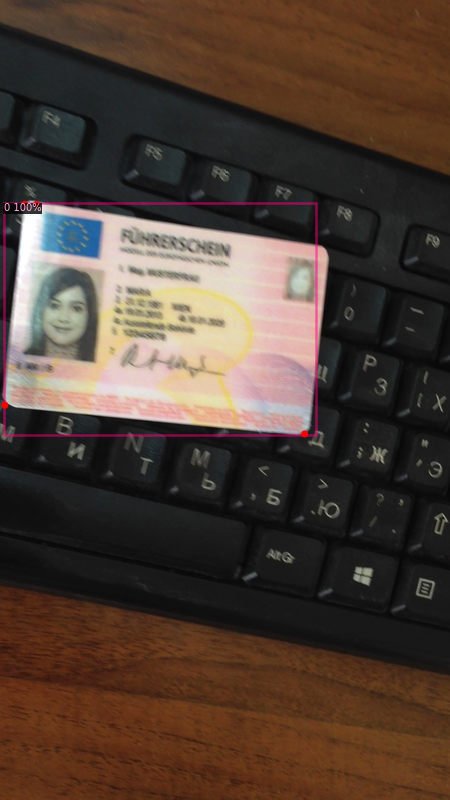

tensor([[0.0549, 0.2554],
        [0.0816, 0.2554],
        [0.6769, 0.5425],
        [0.0110, 0.5065]])
02_aut_drvlic_new/images/PA/PA02_28.png 0.5267102813547422


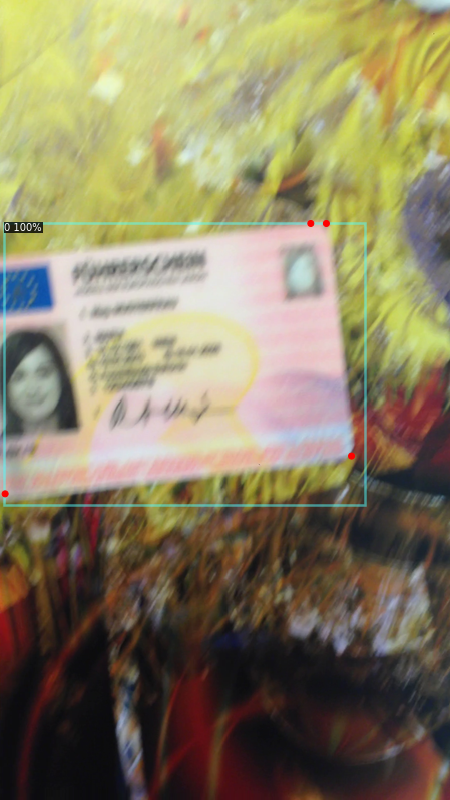

tensor([[0.6907, 0.2793],
        [0.7254, 0.2793],
        [0.7813, 0.5701],
        [0.0114, 0.6173]])
02_aut_drvlic_new/images/PA/PA02_29.png 0.8865793298723138


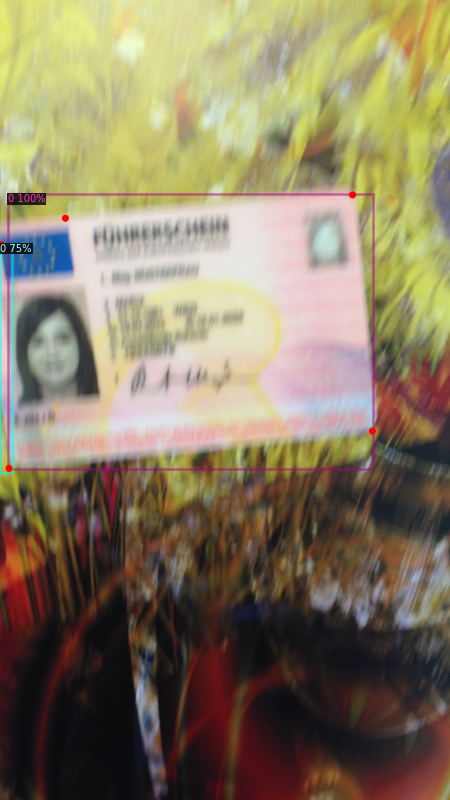

tensor([[0.1453, 0.2728],
        [0.7836, 0.2436],
        [0.8275, 0.5390],
        [0.0201, 0.5855]])
02_aut_drvlic_new/images/PS/PS02_27.png 0.5073105705180709


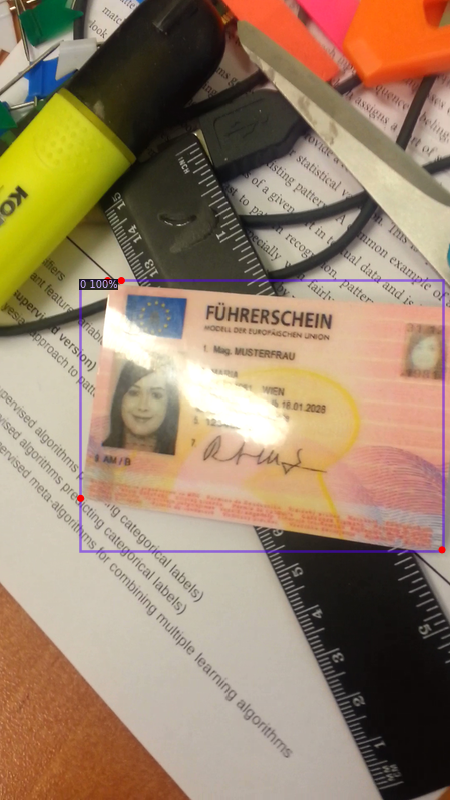

tensor([[0.2390, 0.3507],
        [0.2696, 0.3507],
        [0.9823, 0.6874],
        [0.1790, 0.6229]])
02_aut_drvlic_new/images/PS/PS02_28.png 0.5061440669732844


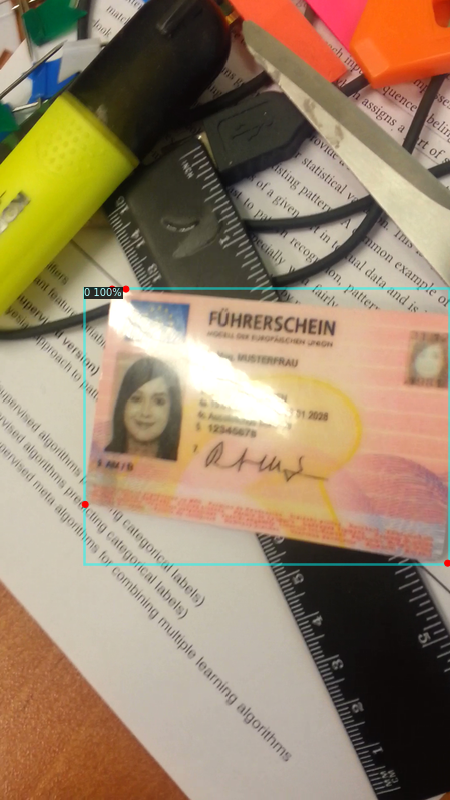

tensor([[0.2491, 0.3614],
        [0.2798, 0.3614],
        [0.9948, 0.7040],
        [0.1892, 0.6305]])
02_aut_drvlic_new/images/TS/TS02_29.png 0.9463423445626764


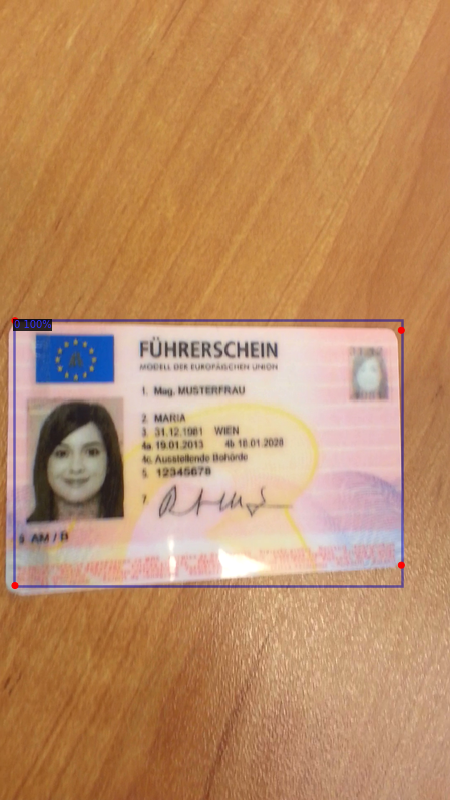

tensor([[0.0332, 0.4009],
        [0.8918, 0.4129],
        [0.8918, 0.7065],
        [0.0332, 0.7319]])
03_aut_id_old/images/PA/PA03_26.png 0.9316421001178505


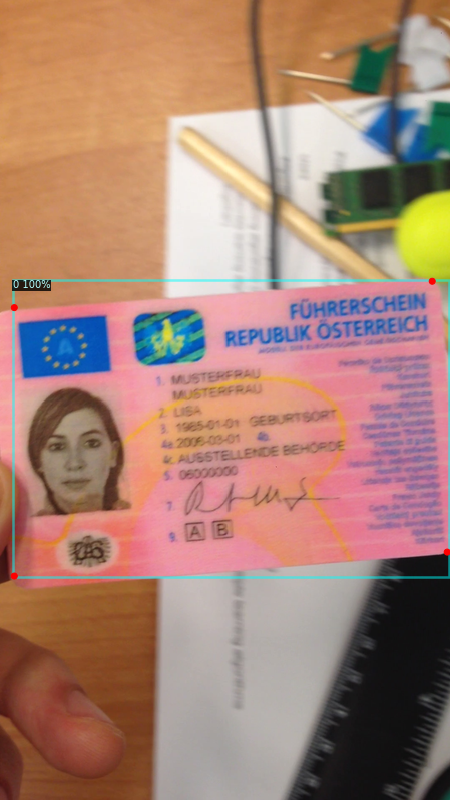

tensor([[0.0318, 0.3845],
        [0.9605, 0.3516],
        [0.9938, 0.6901],
        [0.0318, 0.7201]])
03_aut_id_old/images/PA/PA03_28.png 0.9459691610111441


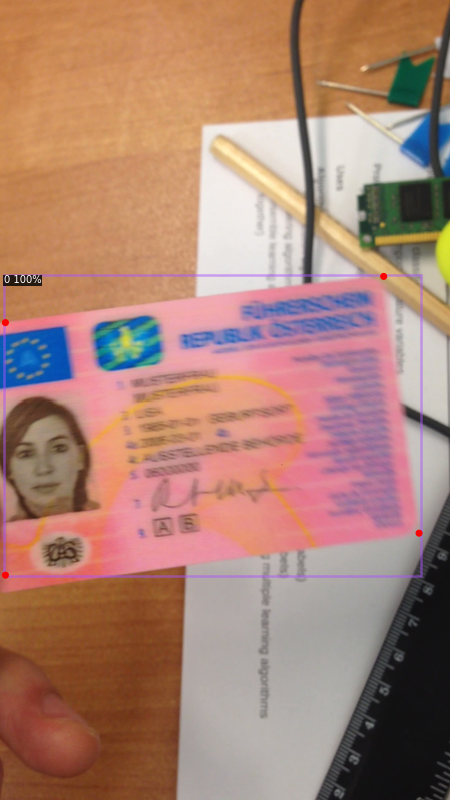

tensor([[0.0120, 0.4032],
        [0.8527, 0.3455],
        [0.9313, 0.6665],
        [0.0120, 0.7190]])


In [118]:
for i, (pic, val) in enumerate(low_iou_pics.items()):
    pic = pic.replace("ground_truth", "images")
    pic = pic.replace("json", "png")
    pic = pic.replace("|", "/")
    print(pic, val)
    im = cv2.imread("/kaggle/input/idcardsdataset/" + pic)
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    outputs = outputs["instances"].to("cpu")
    high_score_outputs = outputs[outputs.scores >= 0.35]
    v = Visualizer(im[:, :, ::-1])
    out = v.draw_instance_predictions(high_score_outputs)
    cv2_imshow(out.get_image()[:, :, ::-1])

    preds = outputs.pred_keypoints.cpu()
    preds = preds[0][:4, :2]
    preds[:, 0] = preds[:, 0] / dp[i].image_size[0]
    preds[:, 1] = preds[:, 1] / dp[i].image_size[1]   
    print(preds)
    if i == 20:
        break

In [108]:
from IPython.display import FileLink, FileLinks

FileLink(r'./pred.json')

NameError: name 'FileLink' is not defined

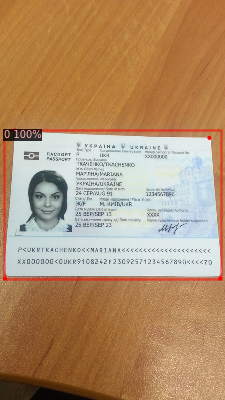

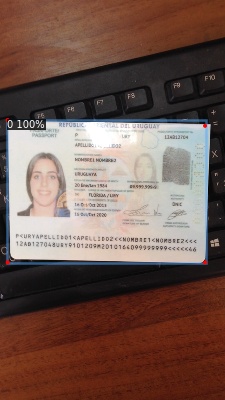

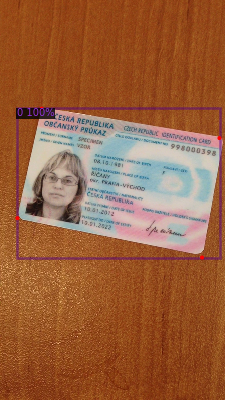

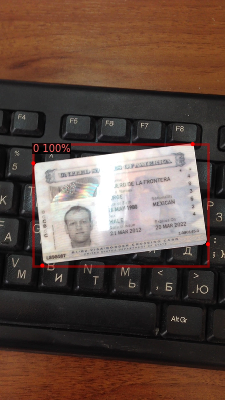

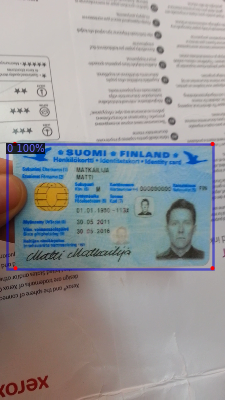

...

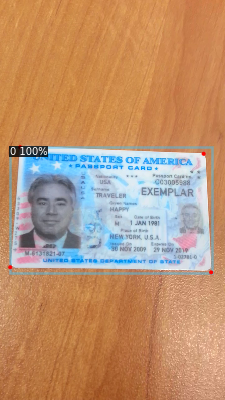

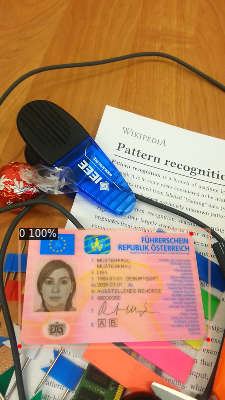

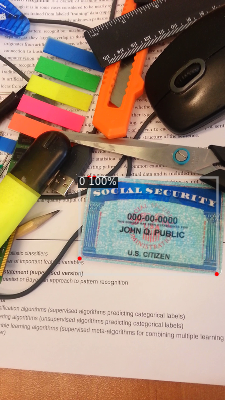

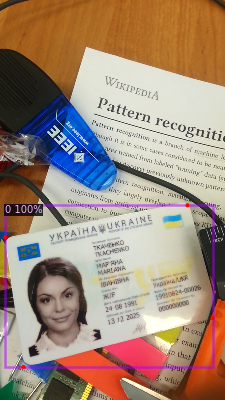

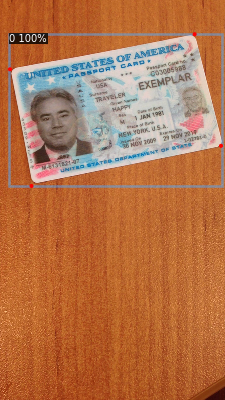

In [62]:
dataset_dicts = get_dicts(data_packs, train_set=False)

for n in range(20):
    pic = random.choice(dataset_dicts)
    im = cv2.imread(pic["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    outputs = outputs["instances"].to("cpu")
    high_score_outputs = outputs[outputs.scores >= 0.35]
    v = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get('id_valid'), scale=0.5)
    out = v.draw_instance_predictions(high_score_outputs)
    cv2_imshow(out.get_image()[:, :, ::-1])